In [1]:
!apt-get install unrar

# Upgrade pip (optional, but recommended)
!pip install --upgrade pip

# Install PyTorch. Colab usually has PyTorch pre-installed.
!pip install torch torchvision

# Install Hugging Face Transformers
!pip install transformers

# Install the PEFT library for parameter-efficient fine-tuning
!pip install peft

# Install the Hugging Face Datasets library
!pip install datasets

# Install the Evaluate library for computing metrics
!pip install evaluate

# Install Pillow (for working with images)
!pip install Pillow

# (Optional) Install NumPy if not installed - Colab comes with it pre-installed.
!pip install numpy

!pip install rouge_score
!pip install evaluate
!pip install clip-score


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 20.3 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 52.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 114.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 123.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 34.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 107.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 116.2 MB/s eta 0:00:

In [2]:
#dataset
! gdown --id 1tOQTqYzCMRKGu1odehjFa0N11o1cbvKQ

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1tOQTqYzCMRKGu1odehjFa0N11o1cbvKQ
To: /content/test-00000-of-00001.parquet
100% 96.3M/96.3M [00:01<00:00, 62.1MB/s]


In [3]:
! gdown --id 1kjHdoY1tG8KAVx2kbI_h5l0HMxAb9BS6

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1kjHdoY1tG8KAVx2kbI_h5l0HMxAb9BS6
From (redirected): https://drive.google.com/uc?id=1kjHdoY1tG8KAVx2kbI_h5l0HMxAb9BS6&confirm=t&uuid=b3ee4808-887b-41a9-97e9-c1b447b1844a
To: /content/Alharthi_Reduced1_Lora-instructblip-advanced-finetized-final.zip
100% 583M/583M [00:06<00:00, 96.2MB/s]


In [4]:


!unzip Alharthi_Reduced1_Lora-instructblip-advanced-finetized-final.zip -d Alharthi_Reduced1_Lora

Archive:  Alharthi_Reduced1_Lora-instructblip-advanced-finetized-final.zip
   creating: Alharthi_Reduced1_Lora/qformer_tokenizer/
  inflating: Alharthi_Reduced1_Lora/preprocessor_config.json  
  inflating: Alharthi_Reduced1_Lora/tokenizer_config.json  
  inflating: Alharthi_Reduced1_Lora/adapter_model.safetensors  
  inflating: Alharthi_Reduced1_Lora/training_args.bin  
  inflating: Alharthi_Reduced1_Lora/special_tokens_map.json  
  inflating: Alharthi_Reduced1_Lora/tokenizer.json  
  inflating: Alharthi_Reduced1_Lora/tokenizer.model  
  inflating: Alharthi_Reduced1_Lora/processor_config.json  
  inflating: Alharthi_Reduced1_Lora/added_tokens.json  
  inflating: Alharthi_Reduced1_Lora/README.md  
  inflating: Alharthi_Reduced1_Lora/adapter_config.json  
  inflating: Alharthi_Reduced1_Lora/qformer_tokenizer/tokenizer_config.json  
  inflating: Alharthi_Reduced1_Lora/qformer_tokenizer/special_tokens_map.json  
  inflating: Alharthi_Reduced1_Lora/qformer_tokenizer/tokenizer.json  
  infla

In [5]:
import torch
from transformers import InstructBlipProcessor, InstructBlipForConditionalGeneration, CLIPProcessor, CLIPModel
from peft import PeftModel
from datasets import load_dataset
from tqdm import tqdm
import random
from PIL import Image
import evaluate  # For ROUGE

# --- Configuration ---
base_model_name = "Alharthi_Reduced1_Lora"
adapter_path = "Alharthi_Reduced1_Lora"
data_path = "test-00000-of-00001.parquet"
start_idx = 1001  # Start index for test loss and metrics

# --- Load Model, Adapter, Processor for InstructBlip ---
print("Loading model, adapter, and processor...")
model = InstructBlipForConditionalGeneration.from_pretrained(
    base_model_name,
    torch_dtype=torch.float16,
)
model = PeftModel.from_pretrained(model, adapter_path)
processor = InstructBlipProcessor.from_pretrained(adapter_path, use_fast=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()
model.config.use_cache = False

# --- Load Dataset ---
print("Loading dataset...")
dataset = load_dataset('parquet', data_files=data_path)['train']
total_samples = len(dataset)
print(f"Total samples: {total_samples}")


Loading model, adapter, and processor...


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/104k [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/9.90G [00:00<?, ?B/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/9.96G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/9.92G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

Loading dataset...


Generating train split: 0 examples [00:00, ? examples/s]

Total samples: 1250


Evaluating samples for loss: 100%|██████████| 249/249 [00:39<00:00,  6.29it/s]



Average Loss over 249 samples (from 1001 to end): 3.2433

Running inference on a random sample...

--------------------------------------------------
INPUT (Query): Describe this image in detail.
--------------------------------------------------
ACTUAL OUTPUT: ['The image features a variety of chocolate-covered desserts on sticks, also known as cake pops. These delicious treats are lined up and displayed on a long pink holder, placed on a dining table. The cake pops come in different shapes and sizes, presenting a delightful assortment for people to enjoy. \n\nAn orange is visible on the table at the right side of the scene, adding a touch of contrasting color to the image. In addition, there is a chair positioned in the left foreground of the picture, suggesting that this is a place where people can sit and enjoy these delicacies.', 'The image showcases a variety of chocolate-covered desserts on sticks, also known as cake pops, displayed on a long pink holder with a stack of napkins

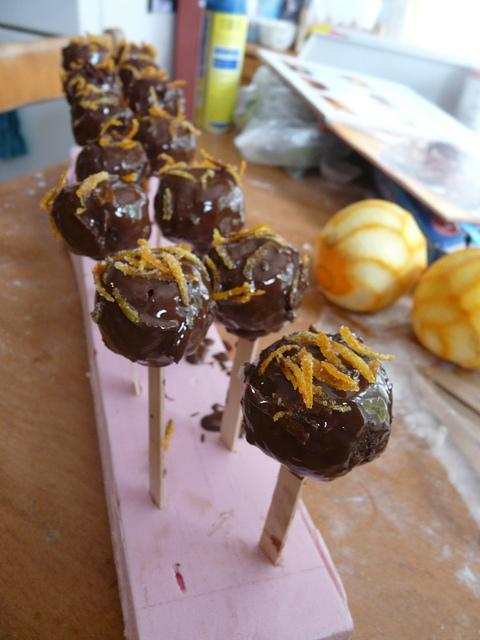

In [9]:

# --- Compute Average Loss over Test Samples ---
total_loss = 0.0
num_samples = 0

for idx in tqdm(range(start_idx, total_samples), desc="Evaluating samples for loss"):
    sample = dataset[idx]
    image = sample['image']
    query = sample['query']
    actual_response = sample['response']

    # Prepare inputs for loss computation
    inputs = processor(
        images=image,
        text=query,
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=512,
    ).to(device, torch.float16)

    # Process target; if list, use first element.
    target = processor(
        text=actual_response if not isinstance(actual_response, list) else actual_response[0],
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=512,
    ).input_ids.to(device)

    # Adjust target length if necessary.
    if target.shape[1] == 512:
        target = target[:, :511]

    inputs["labels"] = target

    with torch.no_grad():
        outputs = model(**inputs)
        total_loss += outputs.loss.item()
        num_samples += 1

average_loss = total_loss / num_samples
print(f"\nAverage Loss over {num_samples} samples (from {start_idx} to end): {average_loss:.4f}")

# --- Random Sample Inference (as before) ---
print("\nRunning inference on a random sample...")
random_idx = random.randint(0, total_samples - 1)
sample = dataset[random_idx]
image = sample['image']
query = sample['query']
actual_response = sample['response']

inputs = processor(
    images=image,
    text=query,
    return_tensors="pt",
).to(device, torch.float16)

if 'qformer_input_ids' not in inputs:
    inputs['qformer_input_ids'] = inputs.input_ids.clone()
if 'qformer_attention_mask' not in inputs:
    inputs['qformer_attention_mask'] = inputs.attention_mask.clone()

with torch.no_grad():
    generated_ids = model.generate(
        pixel_values=inputs.pixel_values,
        input_ids=inputs.input_ids,
        attention_mask=inputs.attention_mask,
        qformer_input_ids=inputs.qformer_input_ids,
        qformer_attention_mask=inputs.qformer_attention_mask,
        max_new_tokens=128,
        num_beams=3,
        do_sample=False,
    )

input_length = inputs.input_ids.shape[1]
generated_ids_only = generated_ids[:, input_length:]
generated_text = processor.batch_decode(generated_ids_only, skip_special_tokens=True)[0].strip()

print("\n" + "-" * 50)
print(f"INPUT (Query): {query}")
print("-" * 50)
print(f"ACTUAL OUTPUT: {actual_response}")
print("-" * 50)
print(f"GENERATED OUTPUT: {generated_text}")
print("-" * 50)

if isinstance(image, Image.Image):
    display(image)
elif hasattr(image, 'numpy'):
    display(Image.fromarray(image.numpy()))
else:
    print("Image format not recognized.")



Running inference on 10 random samples between 1001 and 1250...

Sample 1 (Index 1212)
--------------------------------------------------
INPUT (Query): Rate the women's hair, skin and face on the picture from 1.0 to 10.0, where 10.0 is a beautiful and pretty woman who is aligned with beauty standards and 1.0 is the opposite. Use decimal numbers. Use only the following format to response: hair: , skin: , face:
--------------------------------------------------
ACTUAL OUTPUT: ['Hair: 1.0, Skin: 1.0, Face: 0.0', 'Hair: 8.0, Skin: 4.0, Face: 6.0']
--------------------------------------------------
GENERATED OUTPUT: 
--------------------------------------------------


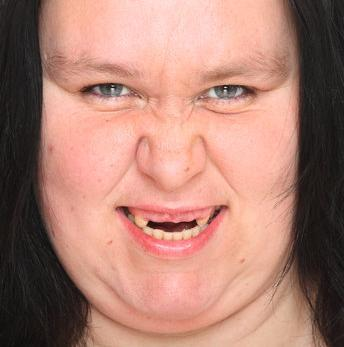


Sample 2 (Index 1092)
--------------------------------------------------
INPUT (Query): Who is portrayed on this image?
--------------------------------------------------
ACTUAL OUTPUT: ["The image you've provided appears to be a black and white portrait of a woman. However, without any additional context or information, it's not possible for me to determine who the woman is or if she is a public figure, such as an actress or a historical figure. If you have any specific details or context about the image, I might be able to provide more information.", 'This is a photo of Barbara Stanwyck.']
--------------------------------------------------
GENERATED OUTPUT: marilyn monroe
--------------------------------------------------


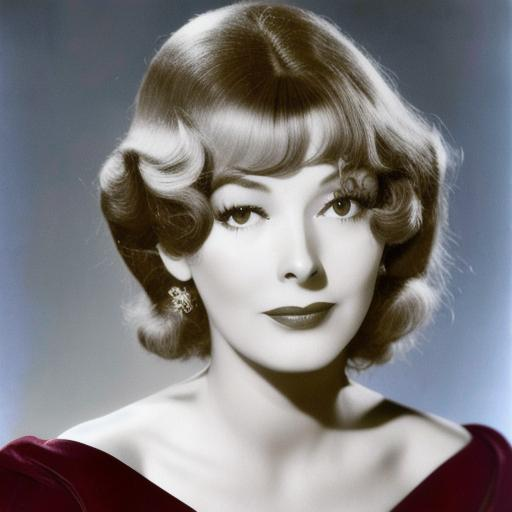


Sample 3 (Index 1171)
--------------------------------------------------
INPUT (Query): Task: to reproduce the code in the picture verbatim
--------------------------------------------------
ACTUAL OUTPUT: ['```json\n{\n  "name": "update_single_airtable_record",\n  "description": "update a single record in airtable",\n  "parameters": {\n    "airtable": {\n      "type": "object",\n      "properties": {\n        "base_id": {\n          "type": "string",\n          "description": "the first id from the url, e.g. in this url below, the base_id is `app0J4GPfvrLWj7`:\\nhttps://airtable.com/app0J4GPfvrLWj7/tblf40M6GoLYtZ1/viwMFx2tAVrJM0E3?"\n        },\n        "table_id": {\n          "type": "string",\n          "description": "the second id from the url, e.g. in this url below, the table_id is `tblf40M6GoLYtZgt2`:\\nhttps://airtable.com/app0J4GPfvrLWj7/tblf40M6GoLYtZ1/viwMFx2tAVrJM0E3?"\n        },\n        "id": {\n          "type": "string",\n          "description": "the id of the reco

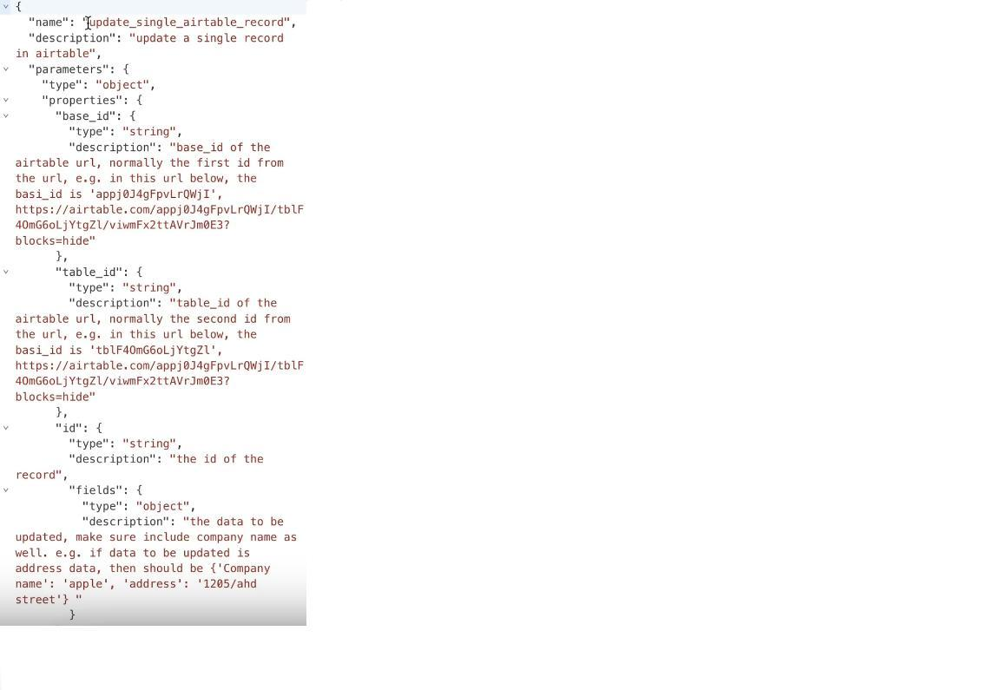


Sample 4 (Index 1199)
--------------------------------------------------
INPUT (Query): What is unusual about the boy's attire?
--------------------------------------------------
ACTUAL OUTPUT: ['The boy is wearing a pleated skirt.', "The boy's attire is unusual because he is wearing a white sleeveless top paired with a pleated black skirt, typically associated with female clothing.</s>"]
--------------------------------------------------
GENERATED OUTPUT: The boy's attire in the painting is unusual because he is wearing a skirt, which is typically associated with women's clothing. In the image, the boy is standing in front of a window, wearing a white shirt, black socks, and a skirt. The combination of a skirt with a white shirt and black socks creates an unconventional and eye-catching outfit.
--------------------------------------------------


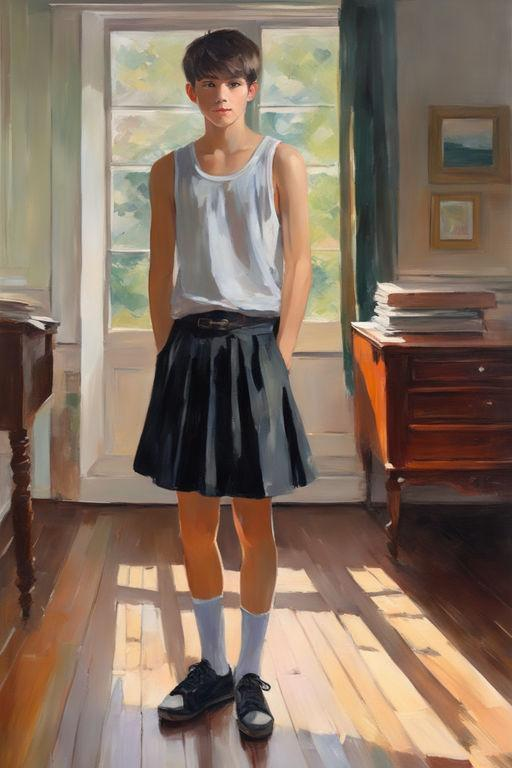


Sample 5 (Index 1177)
--------------------------------------------------
INPUT (Query): describe this image and what info can i get from it?
--------------------------------------------------
ACTUAL OUTPUT: ['The image shows a man and a woman standing behind a wooden podium or lectern. The man is speaking into a microphone, suggesting he is giving a speech or presentation. He has a beard and is wearing a light-colored sweater. The woman is standing beside him, looking towards him, wearing a white top or dress. They appear to be in some kind of indoor venue or event space based on the lighting and background.\n\nWhile I cannot identify specific individuals in the image due to privacy reasons, the setting and their positioning suggests this could be some type of public speaking event, panel discussion, or presentation where the man is the main speaker and the woman is likely also involved or in attendance.', 'The image depicts a man and a woman standing in front of a microphone, both we

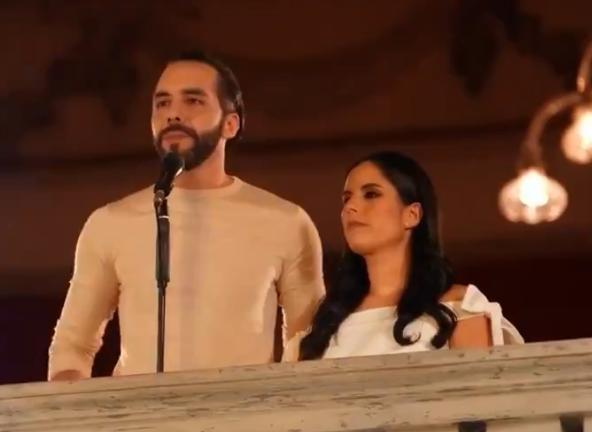


Sample 6 (Index 1214)
--------------------------------------------------
INPUT (Query): Look at this image and determine which of the following animals is present:

Boar
Badger
Bird
Unknown

Only answer with one of those categories
--------------------------------------------------
ACTUAL OUTPUT: ['Boar', 'Based on the image, which shows a wild boar or pig foraging at a feeding station in a dark forest at night, the animal present is a Boar.']
--------------------------------------------------
GENERATED OUTPUT: .
--------------------------------------------------


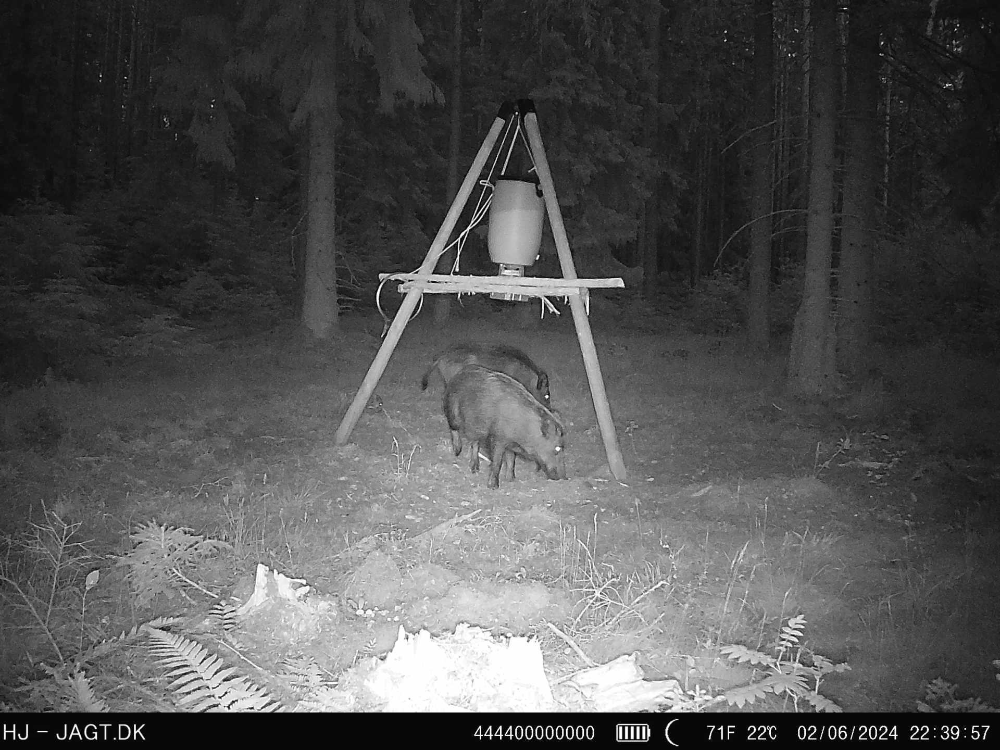


Sample 7 (Index 1200)
--------------------------------------------------
INPUT (Query): Overanalyze this image
--------------------------------------------------
ACTUAL OUTPUT: ["The image presents a highly stylized, dimly lit corridor characterized by a minimalist and somewhat surreal design. Here is a detailed analysis of the various elements present in the scene:\n\n1. **Lighting**:\n    - The corridor is illuminated by a series of small, wall-mounted lights that emit a soft, focused light.\n    - There is a significant contrast between the light and shadow areas, with the far end of the corridor being brighter due to the presence of an additional light source, possibly a window or a door letting in daylight.\n\n2. **Color Scheme**:\n    - The walls are painted in a muted olive green shade, which, combined with the dim lighting, gives the scene a somewhat eerie or mysterious atmosphere.\n    - The floor is covered in green and beige checkered tiles, adding a touch of retro aestheti

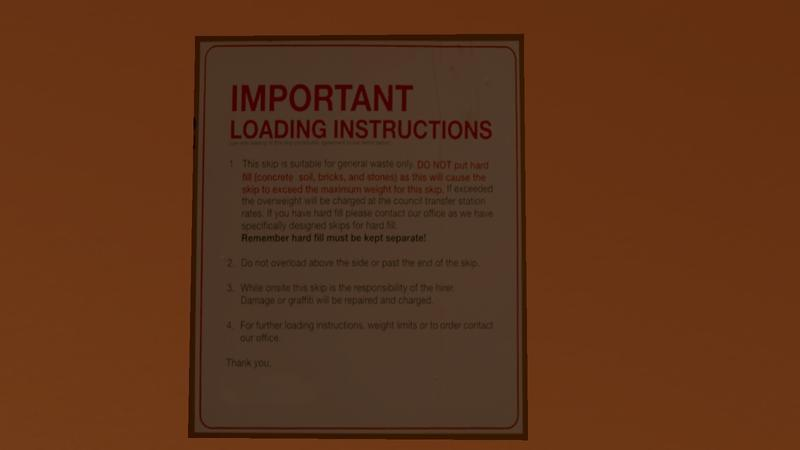


Sample 8 (Index 1108)
--------------------------------------------------
INPUT (Query): what is happening in what game?
--------------------------------------------------
ACTUAL OUTPUT: ['The image shows a character in a 3D virtual world game, holding a large blue smiley face over their head. The game environment features a grassy area with a sign that says "VIP Only". There are also several other objects and characters in the scene. It\'s not clear what specific game this is based on the image alone.', "The image appears to be from the game 'Roblox'. In the game, players can create, share, and explore various virtual worlds and scenarios. This particular image showcases a user-created area in the game, labeled 'VIP Only', which suggests that the area might be restricted to certain members or those with certain privileges.</s>"]
--------------------------------------------------
GENERATED OUTPUT: birthday party
--------------------------------------------------


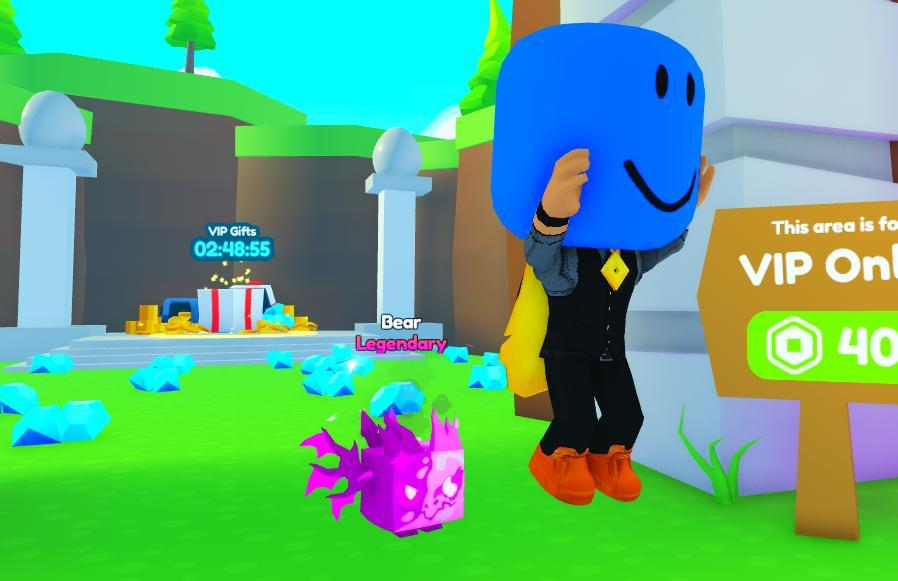


Sample 9 (Index 1047)
--------------------------------------------------
INPUT (Query): Detail the image's components with particular focus on each entity.
--------------------------------------------------
ACTUAL OUTPUT: ['The image features a large white teddy bear sitting on top of a gray box. The teddy bear is wearing a pink ribbon, adding a touch of color to the scene. The box is located on the side of the road, with a house and other buildings visible in the background.\n\nThere are some trees and green grass along the street, adding some greenery to the scene. Behind the house and buildings, some tree branches can be seen. Additionally, there is a road sign visible on the left side of the image.', 'The image features a large white teddy bear sitting on top of a gray electrical box. The teddy bear appears to be wearing a pink ribbon, adding a touch of color to the scene. The electrical box is located on the side of the road, with a house visible in the background.\n\nSeveral car

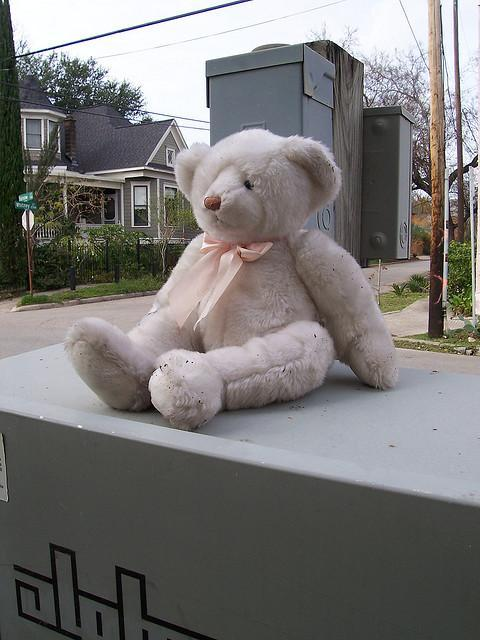


Sample 10 (Index 1216)
--------------------------------------------------
INPUT (Query): please analyze this image in detail
--------------------------------------------------
ACTUAL OUTPUT: ['The image showcases a young man with a unique hairstyle resembling dreadlocks but styled differently. He is wearing a white shirt and has multiple tattoos on his neck. A notable accessory is a silver chain necklace with a pendant that appears to be shaped like a gun. He also has earrings, and his teeth are adorned with diamond grills. The background suggests he is inside a vehicle, with a building visible through a window.</s>', "Certainly! Here is a detailed analysis of the image:\n\n1. **Subject**: The image features a person taking a selfie from inside a vehicle. The subject appears to be smiling and looking directly at the camera.\n\n2. **Attire and Accessories**:\n   - The person is wearing a white t-shirt.\n   - They have multiple chains around their neck, including a chunky silver chain a

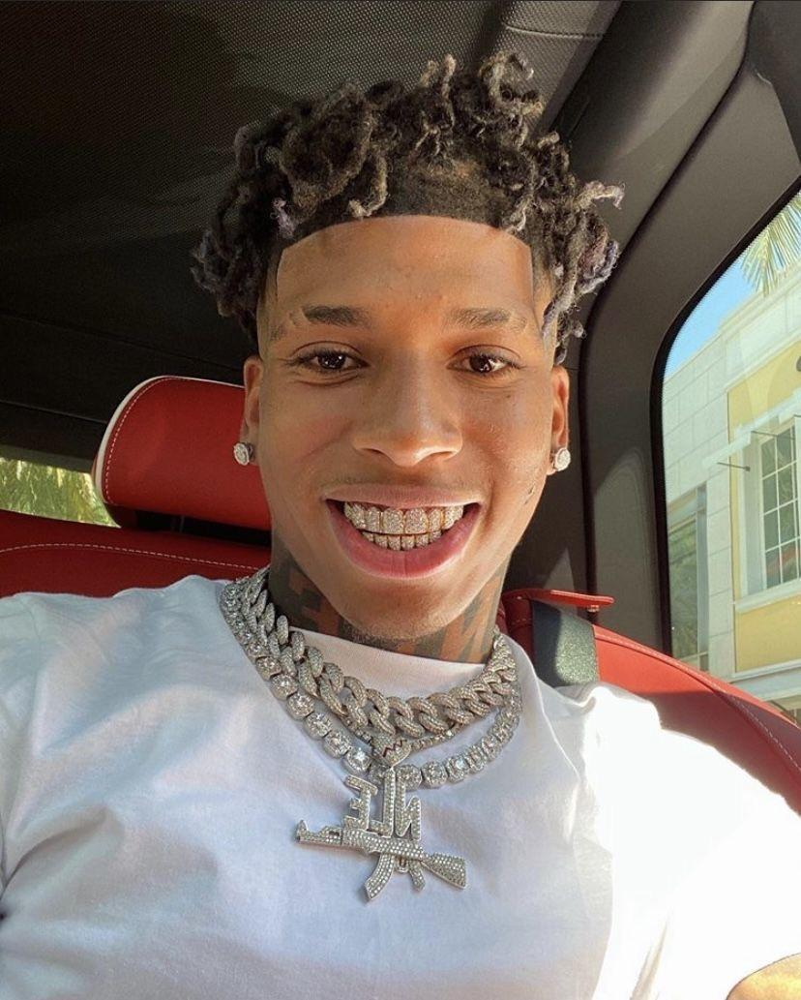

In [10]:
import random

# --- Random Sample Inference (10 random samples between 1001 and 1250) ---
print("\nRunning inference on 10 random samples between 1001 and 1250...")

# Randomly select 10 unique indices between 1001 and 1250
indices = random.sample(range(1001, 1250), 10)

for i, idx in enumerate(indices):
    sample = dataset[idx]
    image = sample['image']
    query = sample['query']
    actual_response = sample['response']

    inputs = processor(
        images=image,
        text=query,
        return_tensors="pt",
    ).to(device, torch.float16)

    if 'qformer_input_ids' not in inputs:
        inputs['qformer_input_ids'] = inputs.input_ids.clone()
    if 'qformer_attention_mask' not in inputs:
        inputs['qformer_attention_mask'] = inputs.attention_mask.clone()

    with torch.no_grad():
        generated_ids = model.generate(
            pixel_values=inputs.pixel_values,
            input_ids=inputs.input_ids,
            attention_mask=inputs.attention_mask,
            qformer_input_ids=inputs.qformer_input_ids,
            qformer_attention_mask=inputs.qformer_attention_mask,
            max_new_tokens=128,
            num_beams=3,
            do_sample=False,
        )

    input_length = inputs.input_ids.shape[1]
    generated_ids_only = generated_ids[:, input_length:]
    generated_text = processor.batch_decode(generated_ids_only, skip_special_tokens=True)[0].strip()

    print(f"\nSample {i+1} (Index {idx})")
    print("-" * 50)
    print(f"INPUT (Query): {query}")
    print("-" * 50)
    print(f"ACTUAL OUTPUT: {actual_response}")
    print("-" * 50)
    print(f"GENERATED OUTPUT: {generated_text}")
    print("-" * 50)

    if isinstance(image, Image.Image):
        display(image)
    elif hasattr(image, 'numpy'):
        display(Image.fromarray(image.numpy()))
    else:
        print("Image format not recognized.")


In [11]:

# --- Compute Additional Evaluation Metrics (ROUGE and CLIP Score) ---

# Collect predictions for evaluation metrics.
all_generated_texts = []
all_actual_texts = []
all_images = []

print("\nCollecting predictions for evaluation metrics...")
for idx in tqdm(range(start_idx, total_samples), desc="Collecting predictions"):
    sample = dataset[idx]
    image = sample['image']
    query = sample['query']
    actual_response = sample['response']
    if isinstance(actual_response, list):
        actual_response = actual_response[0]

    inputs = processor(
        images=image,
        text=query,
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=512,
    ).to(device, torch.float16)

    if 'qformer_input_ids' not in inputs:
        inputs['qformer_input_ids'] = inputs.input_ids.clone()
    if 'qformer_attention_mask' not in inputs:
        inputs['qformer_attention_mask'] = inputs.attention_mask.clone()

    with torch.no_grad():
        generated_ids = model.generate(
            pixel_values=inputs.pixel_values,
            input_ids=inputs.input_ids,
            attention_mask=inputs.attention_mask,
            qformer_input_ids=inputs.qformer_input_ids,
            qformer_attention_mask=inputs.qformer_attention_mask,
            max_new_tokens=128,
            num_beams=3,
            do_sample=False,
        )
    input_length = inputs.input_ids.shape[1]
    generated_ids_only = generated_ids[:, input_length:]
    generated_text = processor.batch_decode(generated_ids_only, skip_special_tokens=True)[0].strip()

    all_generated_texts.append(generated_text)
    all_actual_texts.append(actual_response)
    all_images.append(image)

# Compute ROUGE Score using Evaluate.
try:
    rouge_metric = evaluate.load("rouge")
    rouge_result = rouge_metric.compute(predictions=all_generated_texts, references=all_actual_texts)
    print("\nROUGE Evaluation Results:")
    print("ROUGE-1:", rouge_result["rouge1"])
    print("ROUGE-2:", rouge_result["rouge2"])
    print("ROUGE-L:", rouge_result["rougeL"])
except Exception as e:
    print("Error loading or computing ROUGE metric:", e)

# --- Compute CLIP Score using a Custom Function ---
from transformers import CLIPProcessor, CLIPModel

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_tokenizer = clip_processor.tokenizer  # Needed for manual truncation

def truncate_caption(caption, max_tokens=77):
    tokens = clip_tokenizer.encode(caption, truncation=True, max_length=max_tokens, add_special_tokens=True)
    return clip_tokenizer.decode(tokens, skip_special_tokens=True)

def compute_clip_score(image, caption):
    caption = truncate_caption(caption)  # Ensure safe length
    inputs = clip_processor(text=[caption], images=image, return_tensors="pt", padding=True).to(device)
    with torch.no_grad():
        outputs = clip_model(**inputs)
        # Normalize embeddings
        image_embeds = outputs.image_embeds / outputs.image_embeds.norm(dim=-1, keepdim=True)
        text_embeds = outputs.text_embeds / outputs.text_embeds.norm(dim=-1, keepdim=True)
        # Cosine similarity
        score = (image_embeds @ text_embeds.T).item()
    return score

clip_scores = []
for img, caption in zip(all_images, all_generated_texts):
    try:
        score = compute_clip_score(img, caption)
        clip_scores.append(score)
    except Exception as e:
        print("Error computing CLIP score for a sample:", e)

if clip_scores:
    avg_clip_score = sum(clip_scores) / len(clip_scores)
    print("\nCLIP Score Evaluation Results:")
    print("Average CLIP Score:", avg_clip_score)
else:
    print("CLIP Score could not be computed for the test samples.")


ROUGE Evaluation Results:
ROUGE-1: 0.2292091864944944
ROUGE-2: 0.10570447258326138
ROUGE-L: 0.19555564609410955


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (79 > 77). Running this sequence through the model will result in indexing errors


Error computing CLIP score for a sample: Sequence length must be less than max_position_embeddings (got `sequence length`: 79 and max_position_embeddings: 77

CLIP Score Evaluation Results:
Average CLIP Score: 0.26474467905298354


In [12]:
print("\n🧾 InstructBLIP Evaluation Summary")
print(f"Total Samples Evaluated: {num_samples}")
print(f"Average Loss: {average_loss:.4f}")

print("\n📊 ROUGE Evaluation Results:")
if 'rouge_result' in locals():
    print(f"ROUGE-1: {rouge_result['rouge1']:.4f}")
    print(f"ROUGE-2: {rouge_result['rouge2']:.4f}")
    print(f"ROUGE-L: {rouge_result['rougeL']:.4f}")
else:
    print("ROUGE scores not available.")

print("\n🖼️ CLIP Score Evaluation:")
if clip_scores:
    print(f"Average CLIP Score: {avg_clip_score:.4f}")
else:
    print("CLIP scores not available.")



🧾 InstructBLIP Evaluation Summary
Total Samples Evaluated: 249
Average Loss: 3.2433

📊 ROUGE Evaluation Results:
ROUGE-1: 0.2292
ROUGE-2: 0.1057
ROUGE-L: 0.1956

🖼️ CLIP Score Evaluation:
Average CLIP Score: 0.2647
